# Comparing embeddings

In the following I will compare the latent spaces obtained when using either scRNA-seq, scATAC-seq or both modalities to create the embeddings. For each modality I tried 3 different  of latent space dimensions, namely, 10, 15, 20.

In [8]:
import scanpy as sc
import scvi
import numpy as np
from scipy import sparse

from sklearn.metrics.cluster import adjusted_rand_score
from sklearn.cluster import KMeans
from sklearn.metrics.cluster import adjusted_mutual_info_score
import pandas as pd

In [9]:
from anndata import AnnData


In [22]:
sc.set_figure_params(figsize=(5,5))

In [26]:
plot_dir = "/omics/groups/OE0533/internal/katharina/scDoRI/gastrulation_data_new/Kathi/plots/embeddings/"

In [50]:
# create a dictionary to save ARI scores for different embeddings
metrics = {}

In [11]:
colPalette_celltypes = ['#532C8A',
 '#c19f70',
 '#f9decf',
 '#c9a997',
 '#B51D8D',
 '#3F84AA',
 '#9e6762',
 '#354E23',
 '#F397C0',
 '#ff891c',
 '#635547',
 '#C72228',
 '#f79083',
 '#EF4E22',
 '#989898',
 '#7F6874',
 '#8870ad',
 '#647a4f',
 '#EF5A9D',
 '#FBBE92',
 '#139992',
 '#cc7818',
 '#DFCDE4',
 '#8EC792',
 '#C594BF',
 '#C3C388',
 '#0F4A9C',
 '#FACB12',
 '#8DB5CE',
 '#1A1A1A',
 '#C9EBFB',
 '#DABE99',
 '#65A83E',
 '#005579',
 '#CDE088',
 '#f7f79e',
 '#F6BFCB']

# scRNA-seq

In [12]:
dir_data = "/omics/groups/OE0533/internal/katharina/scDoRI/gastrulation_data/jupyter_notebooks/scvi_perturbation_data/"

## PCA

In [13]:
adata = scvi.data.read_h5ad("/omics/groups/OE0533/internal/katharina/scDoRI/gastrulation_data_new/Kathi/rna_anndata_from_seurat")


In [15]:
adata.layers["counts"] = adata.X.copy() # preserve counts
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
adata.raw = adata # freeze the state in `.raw`

In [16]:

sc.pp.highly_variable_genes(
    adata,
    n_top_genes=5000,
    subset=True,
    layer="counts",
    flavor="seurat_v3",
    batch_key="sample"
)

In [17]:
# compute pca
sc.tl.pca(adata)
sc.pp.neighbors(adata, n_pcs=30, n_neighbors=20)
sc.tl.umap(adata, min_dist=0.3)

In [18]:
# leiden clustering
sc.tl.leiden(adata, key_added="leiden_clusters", resolution=0.6)
print(f"Using Leiden clustering we obtain: {len(adata.obs.leiden_clusters.unique())} clusters")

Using Leiden clustering we obtain: 24 clusters


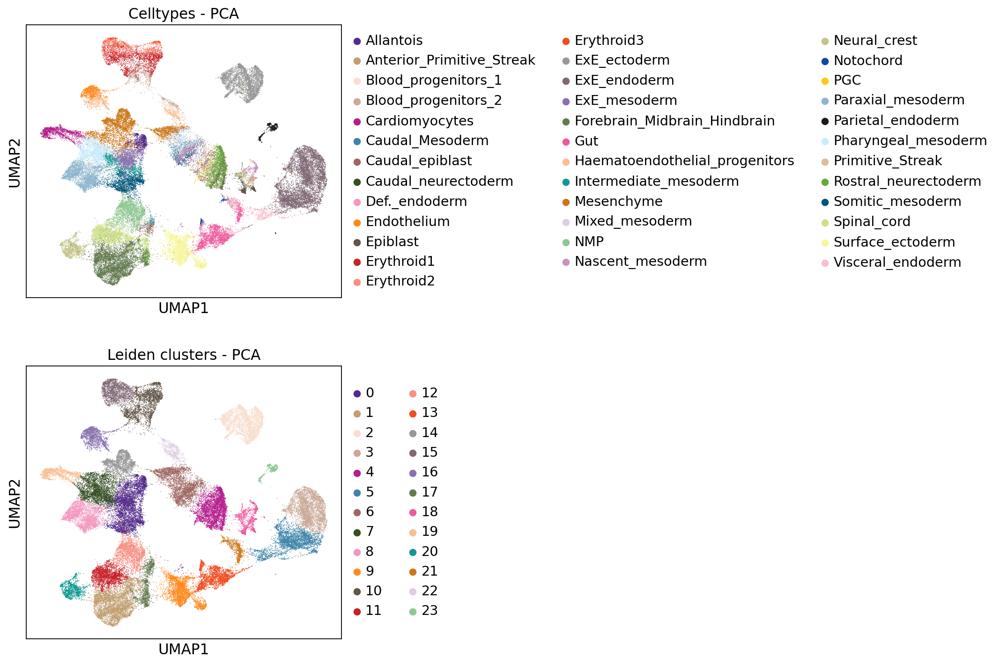

In [40]:
sc.pl.umap(adata, color = ["celltype.mapped", "leiden_clusters"], 
           title = ["Celltypes - PCA", "Leiden clusters - PCA"], 
           palette = colPalette_celltypes, ncols = 1, save = "_pca_emb.pdf")

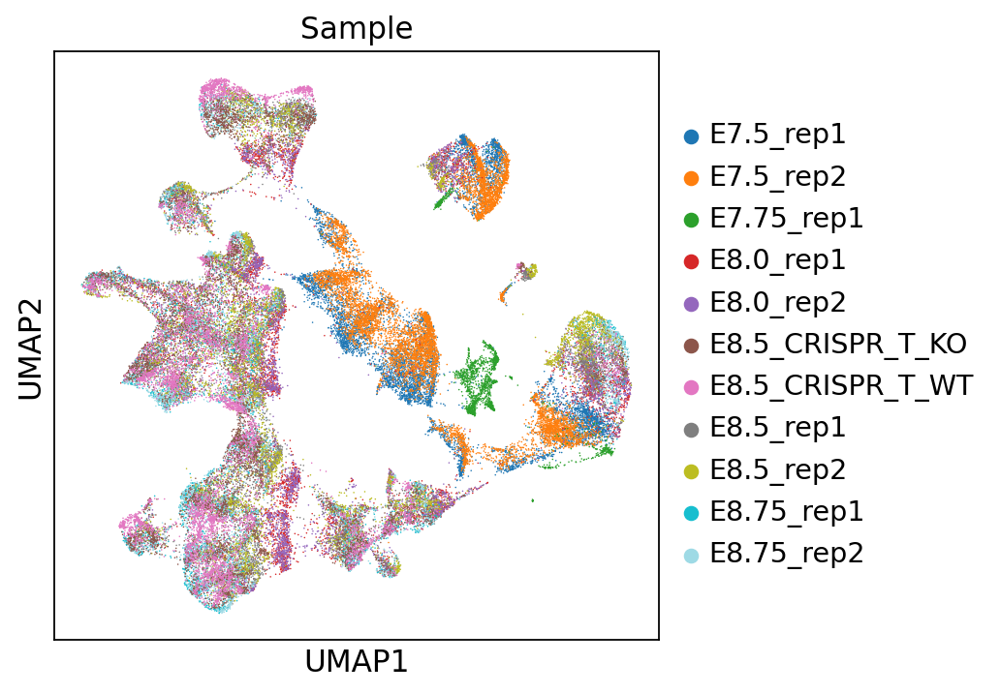

In [39]:
sc.pl.umap(adata, color = [ "sample"], title = [ "Sample"],
           palette = "tab20",ncols = 1,
          save = "_samples_pca_emb.pdf")

In [51]:
metrics["pca"] =  (adjusted_rand_score(adata.obs["celltype.mapped"], adata.obs.leiden_clusters),#adjusted_rand_score(adata.obs.celltype, adata.obs.kmeans),
               adjusted_mutual_info_score(adata.obs["celltype.mapped"], adata.obs.leiden_clusters))#, adjusted_mutual_info_score(adata.obs.celltype, adata.obs.kmeans))

# LSI

In [41]:
ad_atac = sc.read_h5ad("/omics/groups/OE0533/internal/katharina/scDoRI/gastrulation_data_new/Kathi/peak_anndata_from_archr")

In [42]:
emb = pd.read_csv("/omics/groups/OE0533/internal/katharina/scDoRI/gastrulation_data_new/Kathi/lsi_embedding.csv", index_col = 0)#.iloc[:, 0]
### make sure that the cells are in the same order as in the anndata object
emb = emb.reindex(ad_atac.obs.index.tolist())
emb = emb.to_numpy()
ad_atac.obsm["LSI_archr"] = emb

In [43]:
sc.pp.neighbors(ad_atac, use_rep="LSI_archr", n_neighbors=20)
sc.tl.umap(ad_atac, min_dist=0.3)

In [44]:
# leiden clustering
sc.tl.leiden(ad_atac, key_added="leiden_clusters", resolution=0.6)

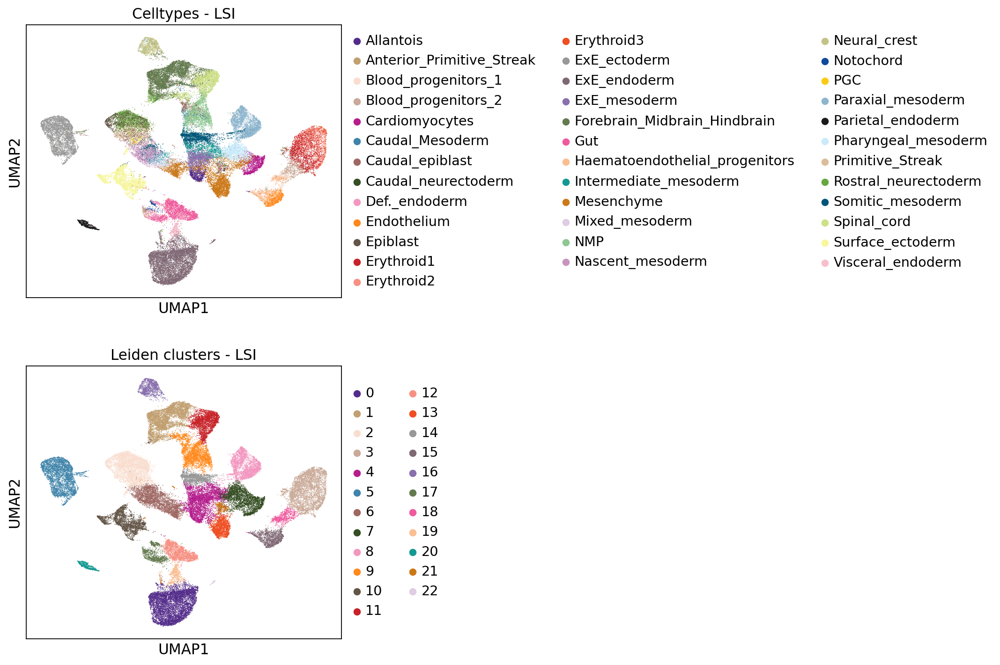

In [47]:
sc.pl.umap(ad_atac, color = ["celltype.mapped", "leiden_clusters"], 
           title = ["Celltypes - LSI", "Leiden clusters - LSI"], 
           palette = colPalette_celltypes, ncols = 1, save = "_lsi_emb.pdf")

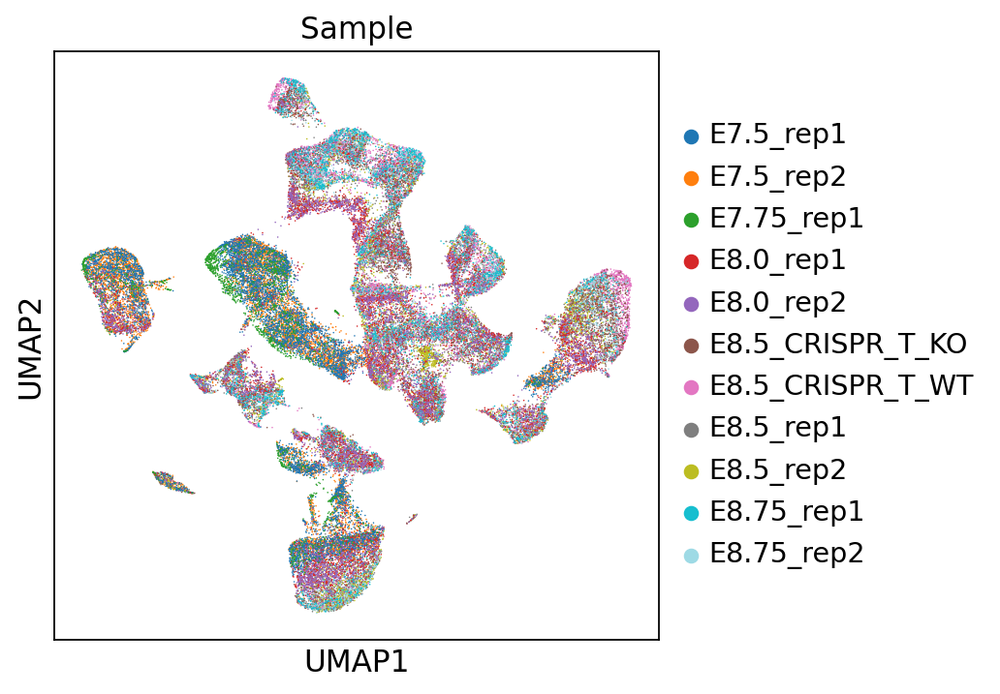

In [48]:
sc.pl.umap(ad_atac, color = [ "sample"], title = [ "Sample"],
           palette = "tab20",ncols = 1,
          save = "_samples_lsi_emb.pdf")

In [52]:
metrics["LSI"] =  (adjusted_rand_score(ad_atac.obs["celltype.mapped"], ad_atac.obs.leiden_clusters),#adjusted_rand_score(adata.obs.celltype, adata.obs.kmeans),
               adjusted_mutual_info_score(ad_atac.obs["celltype.mapped"], ad_atac.obs.leiden_clusters))#, adjusted_mutual_info_score(adata.obs.celltype, adata.obs.kmeans))

# MultiVI

In [115]:
dir_data = "/omics/groups/OE0533/internal/katharina/scDoRI/gastrulation_data/jupyter_notebooks/multivi_perturbation/"

# scVI - perturbations

## Different number of highly variable genes

In [54]:
paths = ["anndata_object_1000hvg", "anndata_object_5000hvg", "anndata_object_10000hvg"]

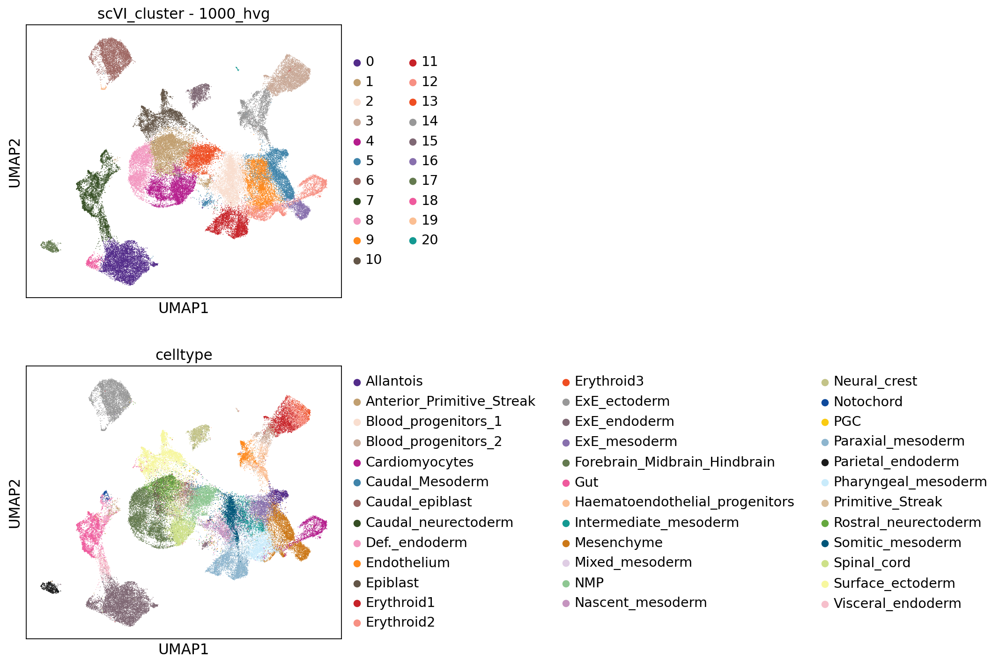

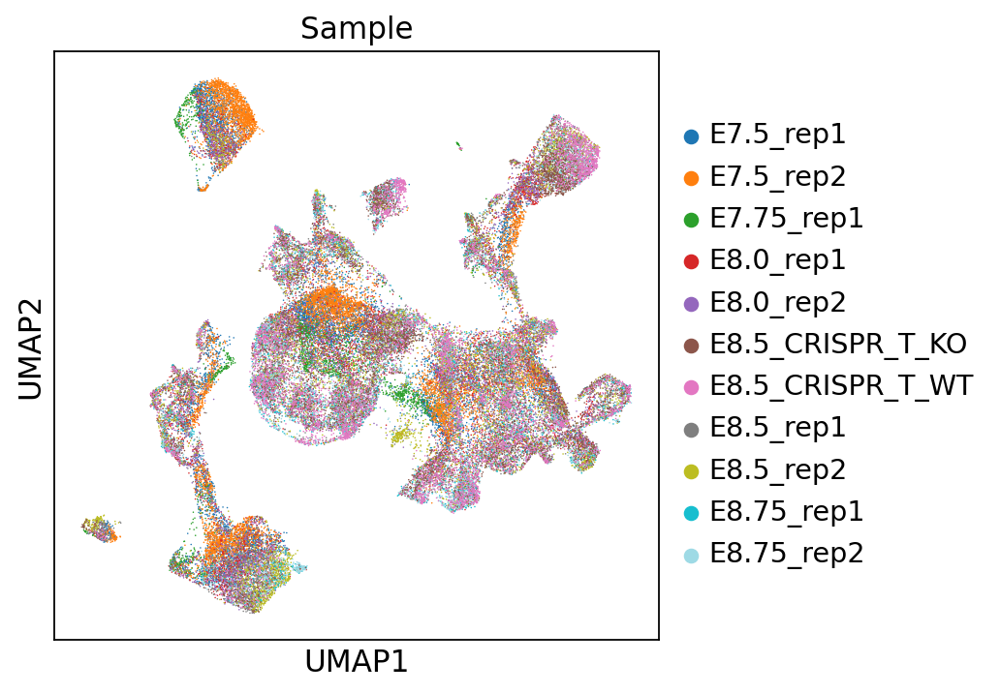

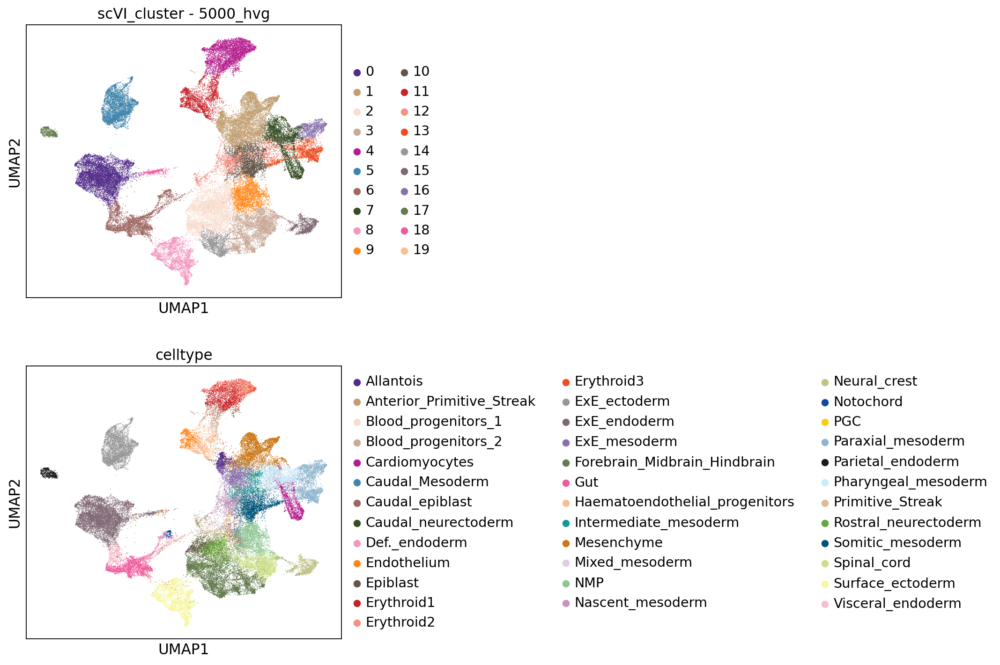

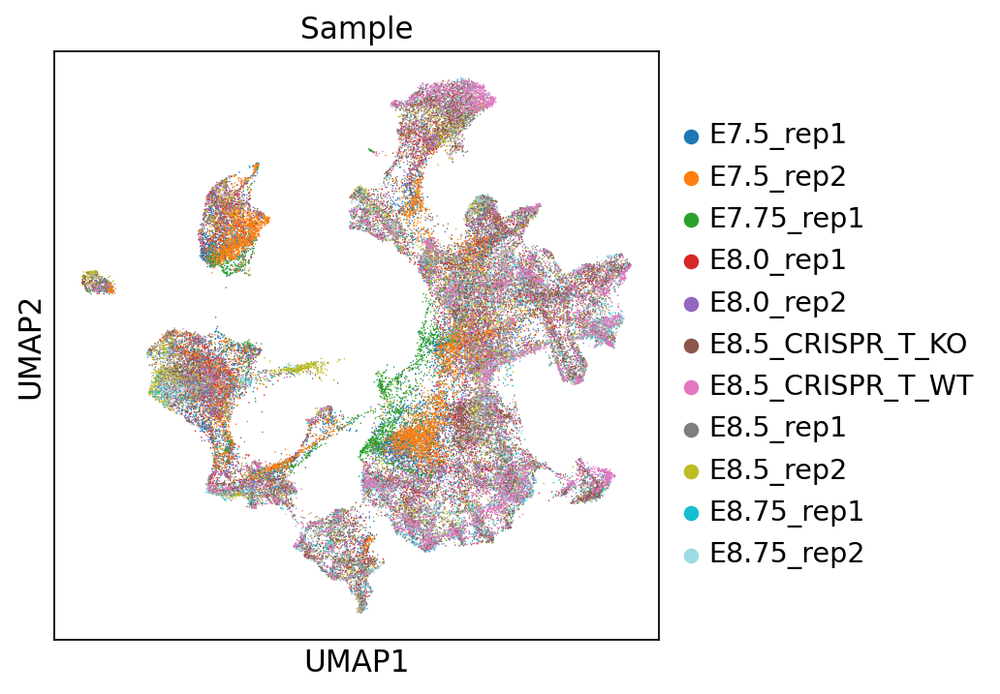

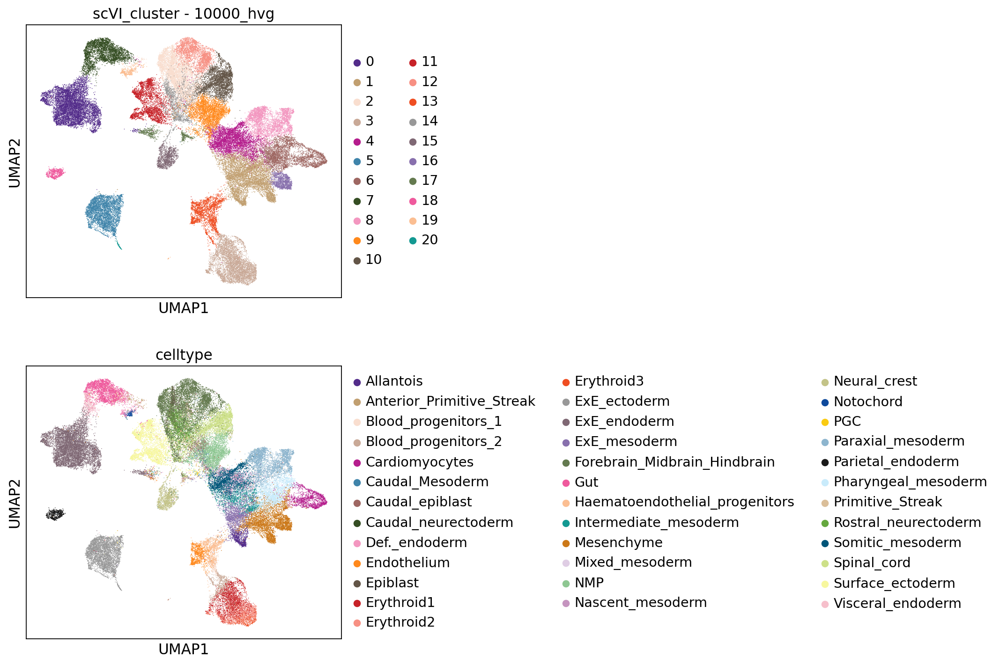

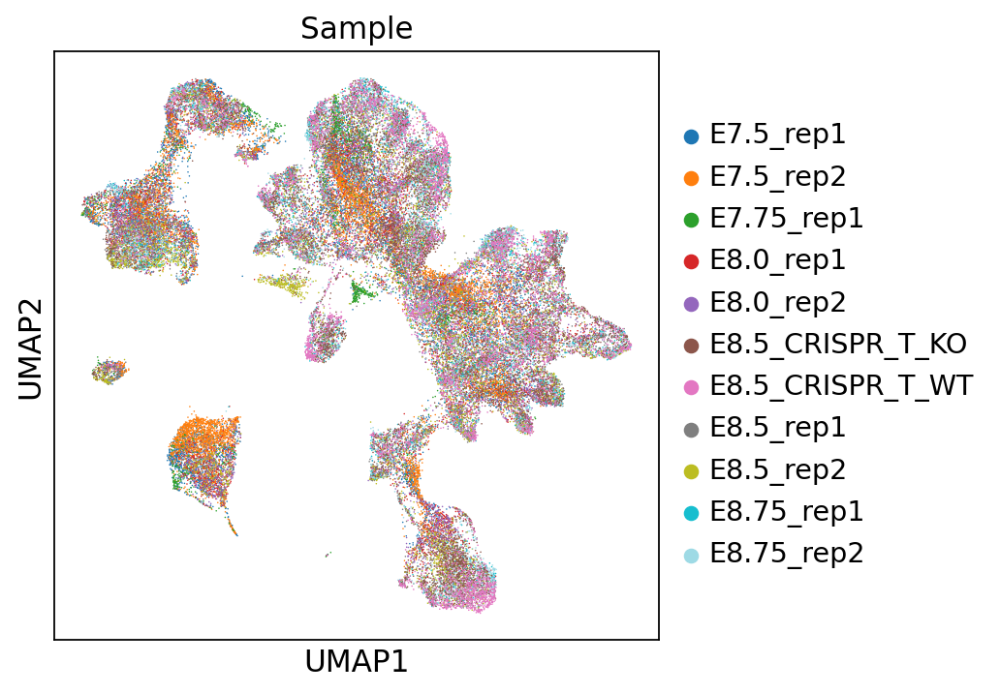

In [56]:
# make sure that the file paths and the number of hvg are in the same orientation!
for p, i in zip(paths, [1000, 5000, 10000]):
    adata = scvi.data.read_h5ad(dir_data + p)
    # use scVI latent space for UMAP generation
    sc.pp.neighbors(adata, use_rep=f"X_scVI_{i}_hvg")
    sc.tl.umap(adata, min_dist=0.3)
    
    # leiden clustering
    sc.tl.leiden(adata, key_added=f"scVI_clusters", resolution=0.6)

    
    # kmeans clustering
    #emb = adata.obsm["X_scVI"]
    #kmeans = KMeans(n_clusters=37,
     #               init="random",
      #              n_init=200,
       #             random_state=0).fit(emb)
    #adata.obs["kmeans"] = kmeans.labels_.astype(str)
    
    sc.pl.umap(adata, color=["scVI_clusters",  "celltype.mapped"], 
               title = [f"scVI_cluster - {i}_hvg", "celltype"], 
               palette = colPalette_celltypes, ncols = 1,
               save = f"_scVI_cluster_{i}_hvg.pdf")
    sc.pl.umap(adata, color="sample", title="Sample", 
               palette="tab20", save=f"_scVI_cluster_sample_{i}_hvg.pdf")

    metrics[f"scvi_{i}hvg"] =  (adjusted_rand_score(adata.obs["celltype.mapped"], adata.obs.scVI_clusters),#adjusted_rand_score(adata.obs.celltype, adata.obs.kmeans),
                   adjusted_mutual_info_score(adata.obs["celltype.mapped"], adata.obs.scVI_clusters))#, adjusted_mutual_info_score(adata.obs.celltype, adata.obs.kmeans))


## Different dimensions

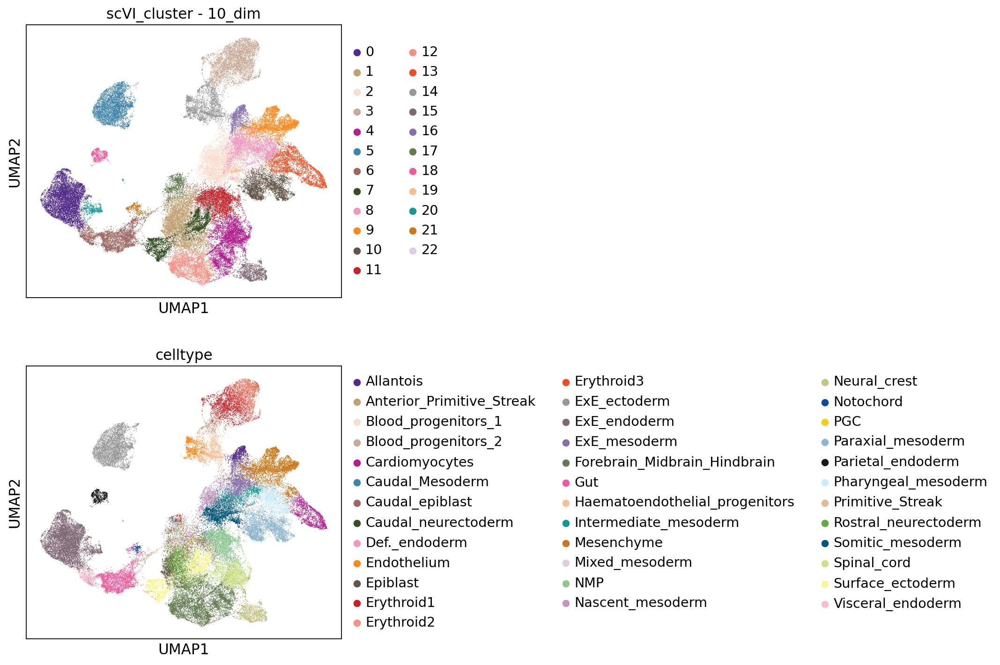

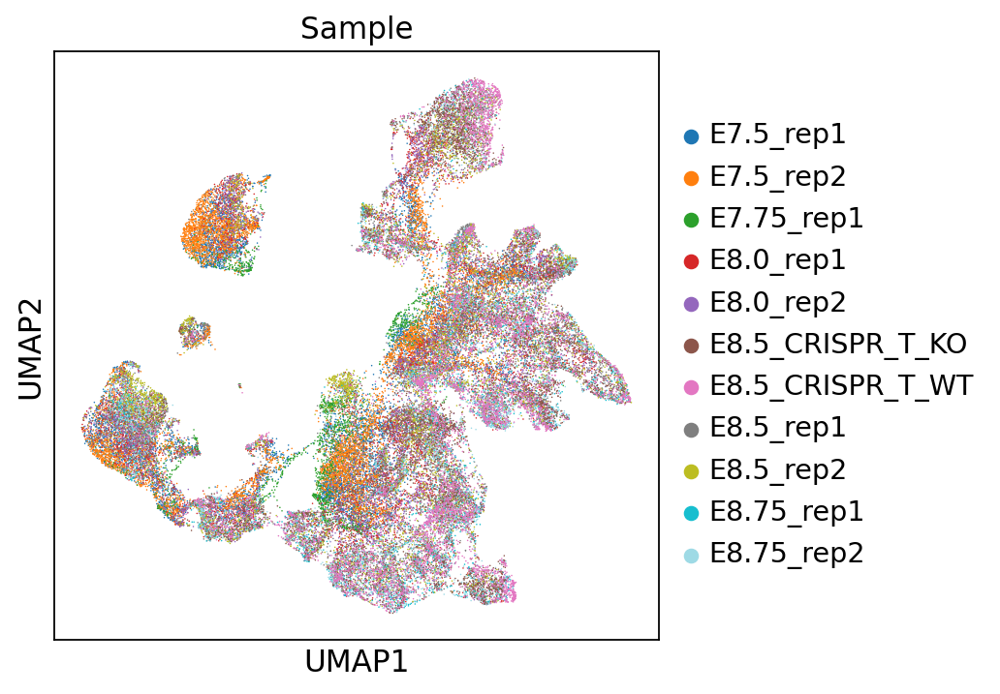

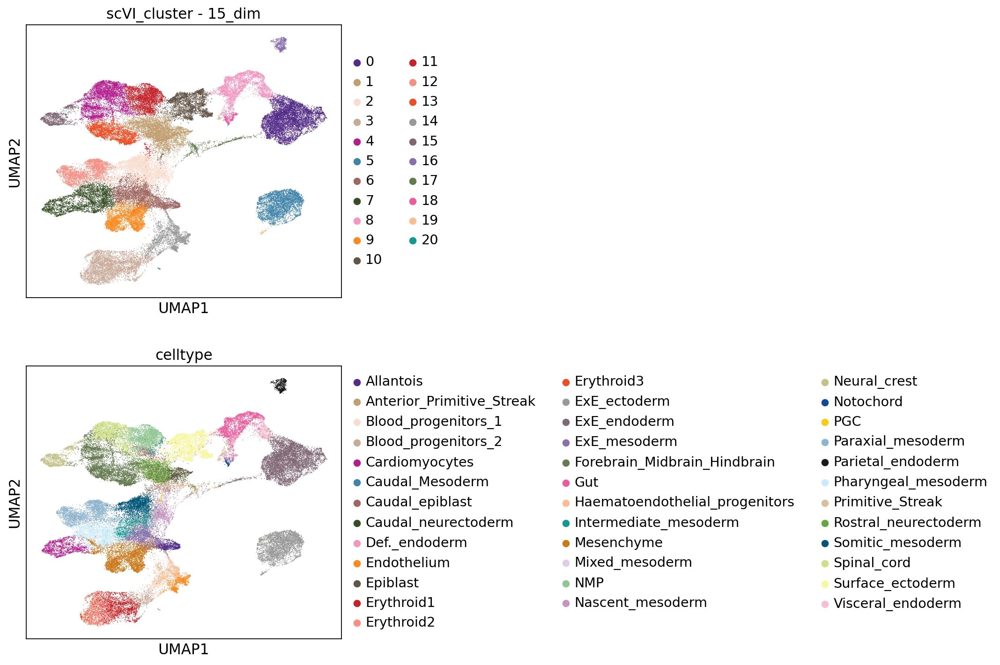

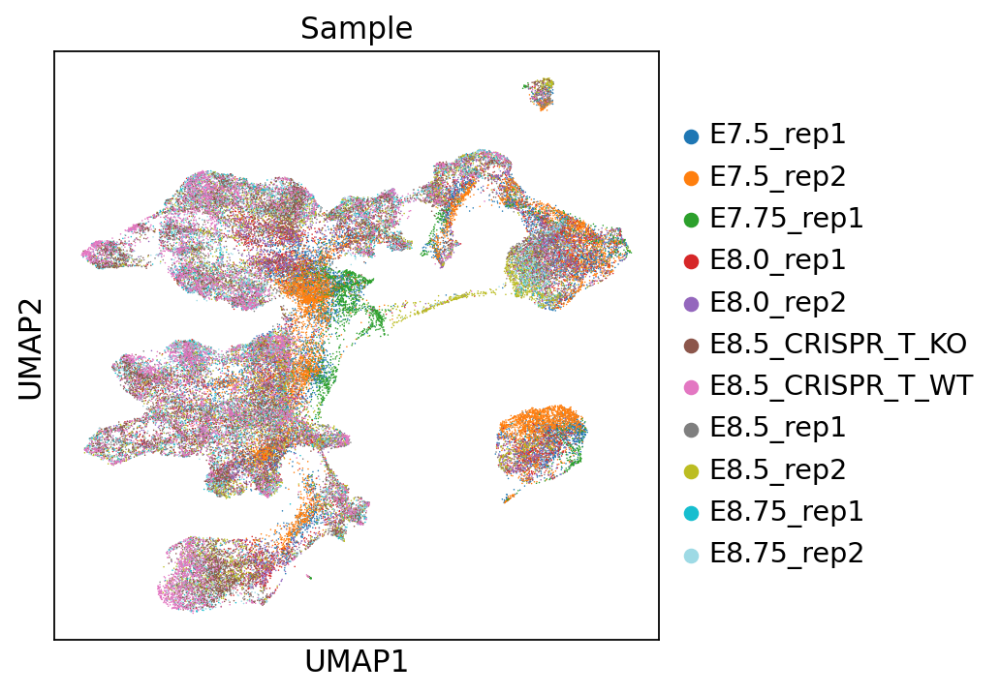

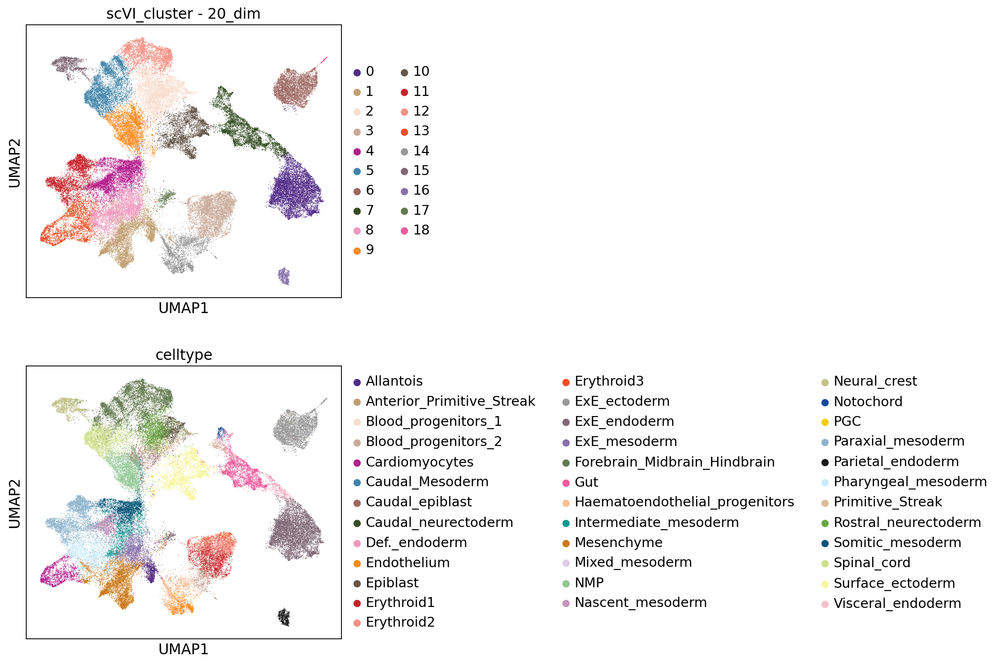

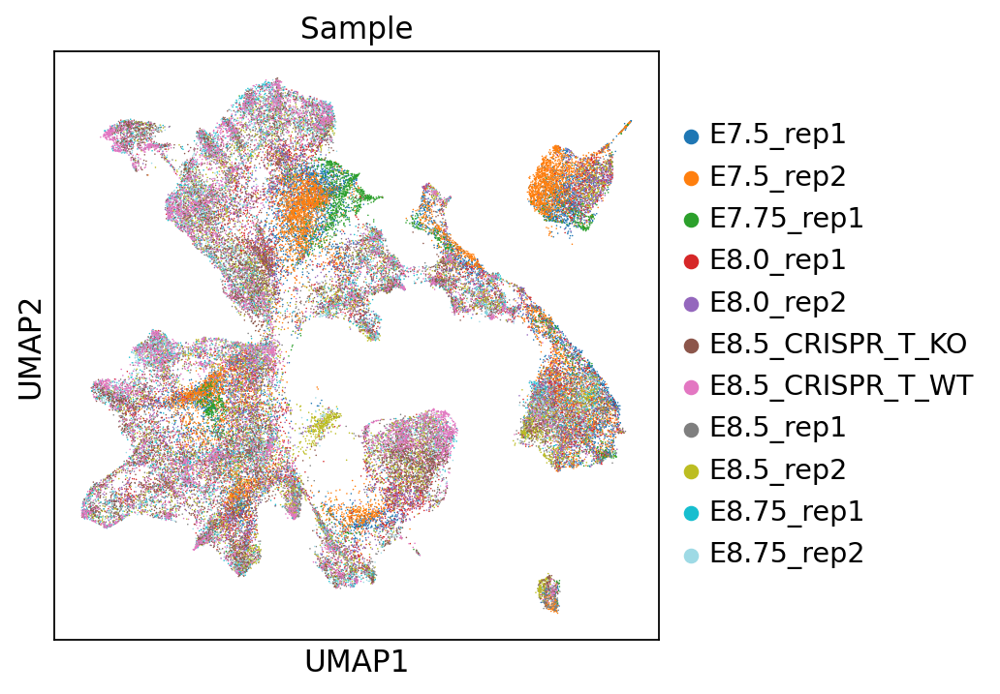

In [58]:
# make sure that the file paths and the number of hvg are in the same orientation!
p = "anndata_object_dims"
adata = scvi.data.read_h5ad(dir_data + p)

for n in  [10, 15, 20]:
    # use scVI latent space for UMAP generation
    sc.pp.neighbors(adata, use_rep=f"X_scVI_{n}")
    sc.tl.umap(adata, min_dist=0.3)
    
    # leiden clustering
    sc.tl.leiden(adata, key_added=f"scVI_clusters", resolution=0.6)

    
    # kmeans clustering
    #emb = adata.obsm["X_scVI"]
    #kmeans = KMeans(n_clusters=37,
     #               init="random",
      #              n_init=200,
       #             random_state=0).fit(emb)
    #adata.obs["kmeans"] = kmeans.labels_.astype(str)
    
    sc.pl.umap(adata, color=["scVI_clusters",  "celltype.mapped"], 
               title = [f"scVI_cluster - {n}_dim", "celltype"], 
               palette = colPalette_celltypes,  ncols=1,
              save=f"scVI_clsuters_{n}_dim.pdf")
    
    sc.pl.umap(adata, color="sample", title="Sample", 
               palette="tab20", 
                   save=f"_scVI_cluster_sample_{n}_dim.pdf")

    metrics[f"scvi_{n}_dim"] =  (adjusted_rand_score(adata.obs["celltype.mapped"], adata.obs.scVI_clusters),#adjusted_rand_score(adata.obs.celltype, adata.obs.kmeans),
                   adjusted_mutual_info_score(adata.obs["celltype.mapped"], adata.obs.scVI_clusters))#, adjusted_mutual_info_score(adata.obs.celltype, adata.obs.kmeans))


# PeakVI - perturbation

In [59]:
dir_data = "/omics/groups/OE0533/internal/katharina/scDoRI/gastrulation_data/jupyter_notebooks/peakvi_perturbation_data/"

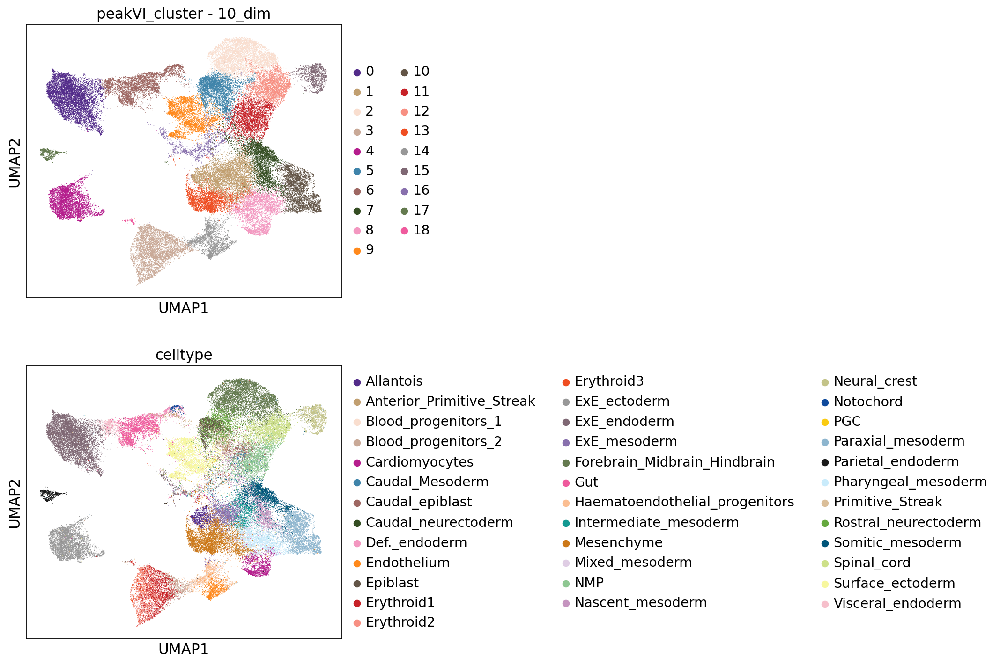

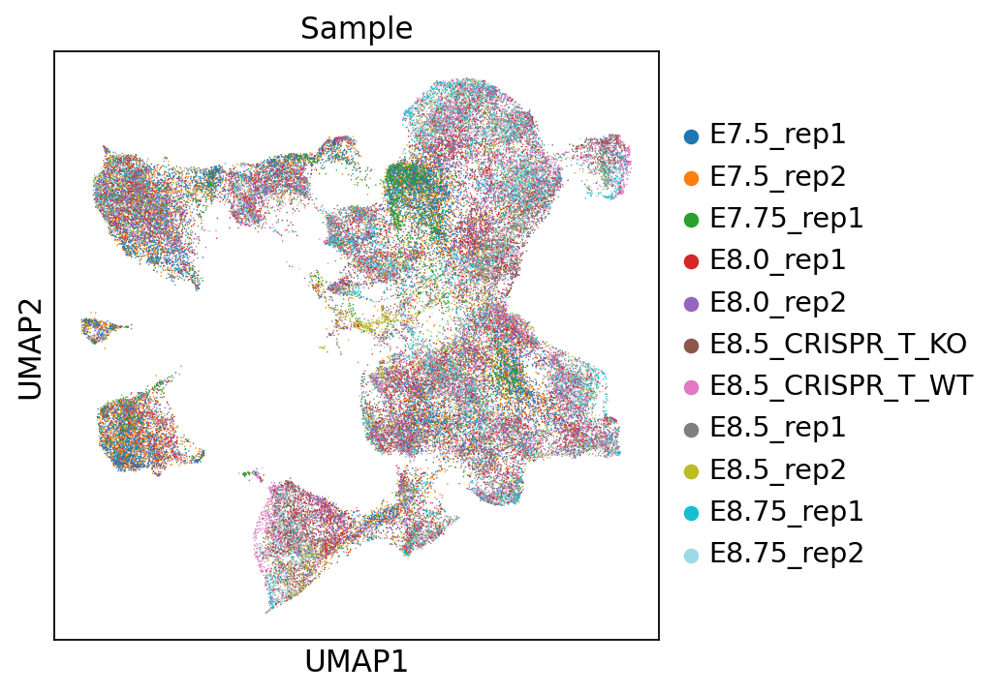

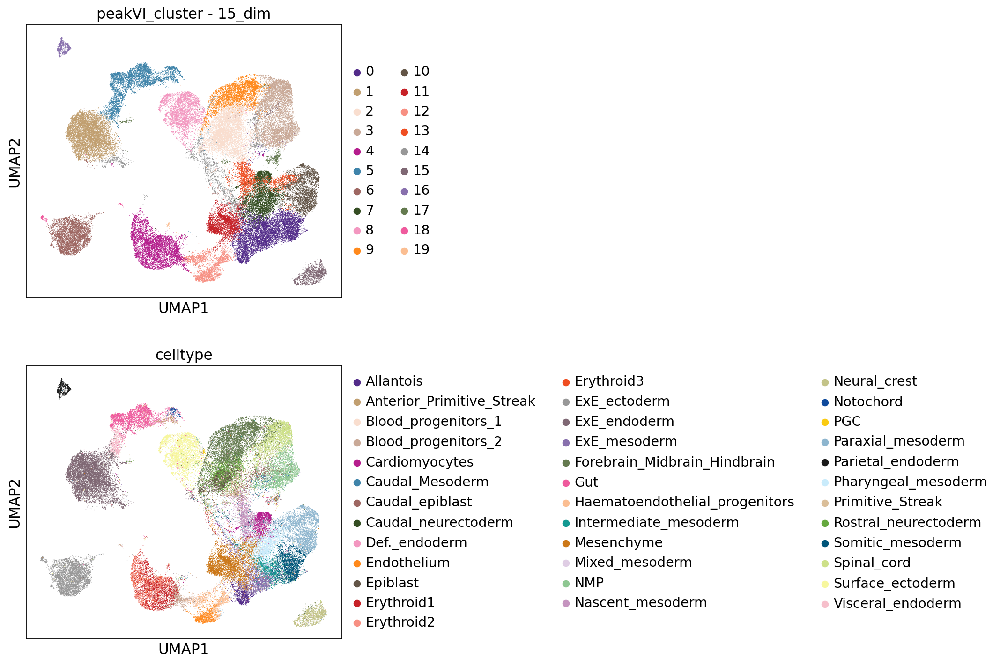

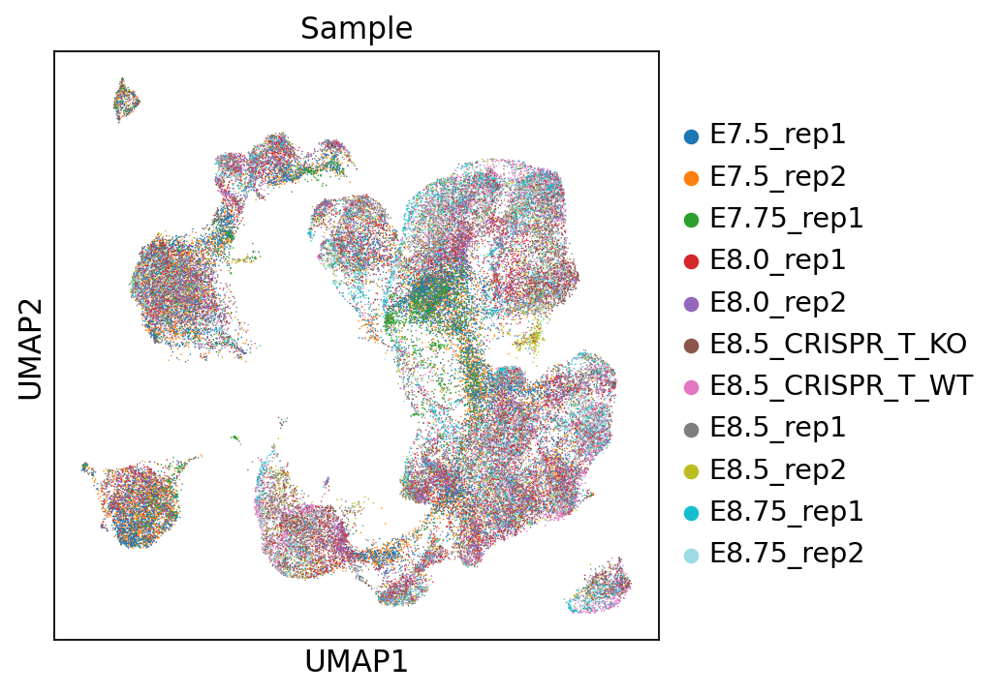

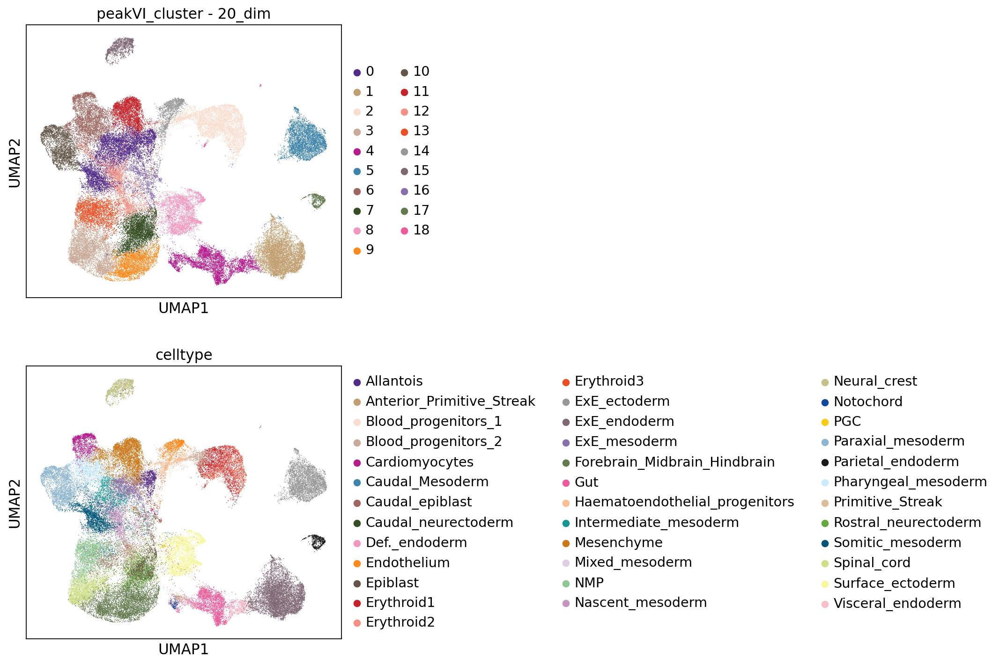

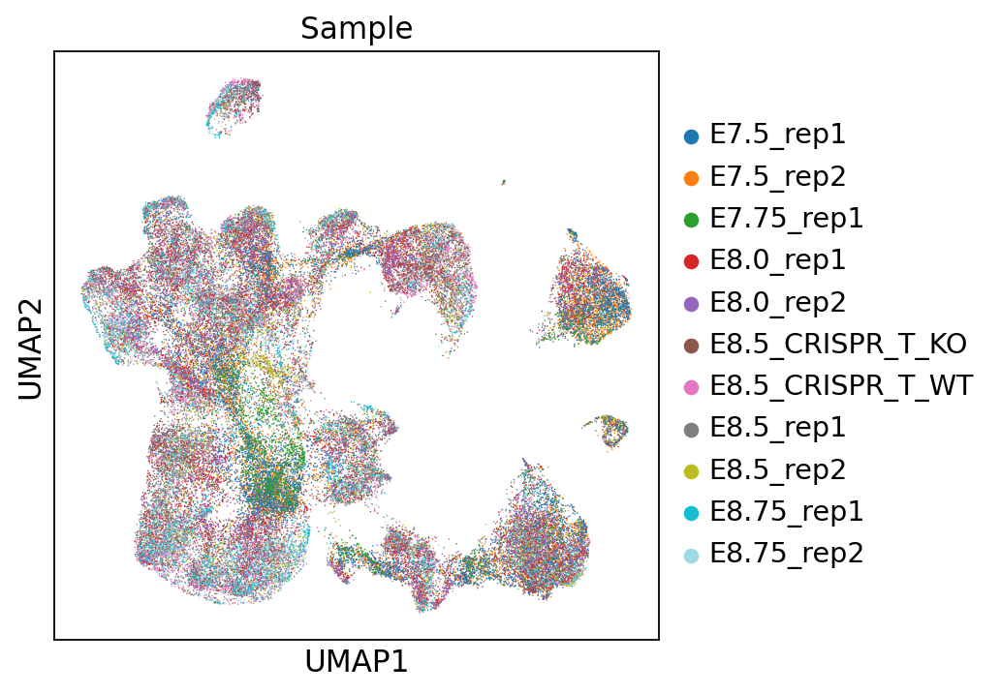

In [60]:
# make sure that the file paths and the number of hvg are in the same orientation!
p = "anndata_object_peakvi_dims"
adata = scvi.data.read_h5ad(dir_data + p)

for n in  [10, 15, 20]:
    # use scVI latent space for UMAP generation
    sc.pp.neighbors(adata, use_rep=f"X_PeakVI_{n}_dim")
    sc.tl.umap(adata, min_dist=0.3)
    
    # leiden clustering
    sc.tl.leiden(adata, key_added=f"scVI_clusters", resolution=0.6)

    
    # kmeans clustering
    #emb = adata.obsm["X_scVI"]
    #kmeans = KMeans(n_clusters=37,
     #               init="random",
      #              n_init=200,
       #             random_state=0).fit(emb)
    #adata.obs["kmeans"] = kmeans.labels_.astype(str)

    sc.pl.umap(adata, color=["scVI_clusters",  "celltype.mapped"], 
           title = [f"peakVI_cluster - {n}_dim", "celltype"], 
           palette = colPalette_celltypes,  ncols=1,
          save=f"peakVI_cluster{n}_dim.pdf")

    sc.pl.umap(adata, color="sample", title="Sample", 
               palette="tab20", 
                   save=f"_peakVI_cluster_sample_{n}_dim.pdf")
    
    #sc.pl.umap(adata, color=["scVI_clusters",  "celltype.mapped"], title = [f"peakVI_cluster - {n}_dim", "celltype"], palette = colPalette_celltypes, size = 15)

    metrics[f"peakvi_{n}_dim"] =  (adjusted_rand_score(adata.obs["celltype.mapped"], adata.obs.scVI_clusters),#adjusted_rand_score(adata.obs.celltype, adata.obs.kmeans),
                   adjusted_mutual_info_score(adata.obs["celltype.mapped"], adata.obs.scVI_clusters))#, adjusted_mutual_info_score(adata.obs.celltype, adata.obs.kmeans))


In [61]:
metrics

{'pca': (0.6132690532216852, 0.760608409020667),
 'LSI': (0.6574138341005245, 0.7523352961649034),
 'scvi_1000hvg': (0.6050154499617011, 0.7475425315665314),
 'scvi_5000hvg': (0.6030387329587159, 0.74953603666201),
 'scvi_10000hvg': (0.6013215108881916, 0.7369350209433826),
 'scvi_10_dim': (0.6247328975990812, 0.7512513369306927),
 'scvi_15_dim': (0.6550850933652074, 0.7727086003019121),
 'scvi_20_dim': (0.6434776390273046, 0.7638234278544588),
 'peakvi_10_dim': (0.6629497033471684, 0.7460282771804593),
 'peakvi_15_dim': (0.5561318542919556, 0.7046091865029156),
 'peakvi_20_dim': (0.5891637333792685, 0.7251584068213475)}

# Plotting Metrics

In [62]:
df = pd.DataFrame.from_dict(metrics)

In [63]:
df

,pca,LSI,scvi_1000hvg,scvi_5000hvg,scvi_10000hvg,scvi_10_dim,scvi_15_dim,scvi_20_dim,peakvi_10_dim,peakvi_15_dim,peakvi_20_dim
0,0.613269,0.657414,0.605015,0.603039,0.601322,0.624733,0.655085,0.643478,0.662950,0.556132,0.589164
1,0.760608,0.752335,0.747543,0.749536,0.736935,0.751251,0.772709,0.763823,0.746028,0.704609,0.725158


In [64]:
df = df.rename(index={0:"ARI-Leiden", 1:"Mutual_information-Leiden"})#, 3:"Mutual_information-kmeans"})

In [67]:
df["metric"] = df.index
df.index = [0,1]

In [91]:
#df = df.rename(columns = {"gpu_trained_10_dim/":"model_rna_10dim", "gpu_trained_15_dim/":"model_rna_15dim", "gpu_trained_20_dim/":"model_rna_20dim", 
         #            "pca":"model_pca",
          #          "atac_gpu_trained_10_dim/":"model_atac_10dim", "atac_gpu_trained_15_dim/":"model_atac_15dim", "atac_gpu_trained_20_dim/":"model_atac_20dim"})

In [ ]:
#df.columns = 'model_atac_10dim', 'model_atac_15dim', 'model_atac_20dim', 'model_pca','model_rna_10dim', 'model_rna_15dim', 'model_rna_20dim', 'metric'

In [68]:
df

,pca,LSI,scvi_1000hvg,scvi_5000hvg,scvi_10000hvg,scvi_10_dim,scvi_15_dim,scvi_20_dim,peakvi_10_dim,peakvi_15_dim,peakvi_20_dim,metric
0,0.613269,0.657414,0.605015,0.603039,0.601322,0.624733,0.655085,0.643478,0.662950,0.556132,0.589164,ARI-Leiden
1,0.760608,0.752335,0.747543,0.749536,0.736935,0.751251,0.772709,0.763823,0.746028,0.704609,0.725158,Mutual_information-Leiden


In [69]:
df = df.melt("metric", var_name = "model", value_name = "val")

In [70]:
import seaborn as sns
import matplotlib.pyplot as plt

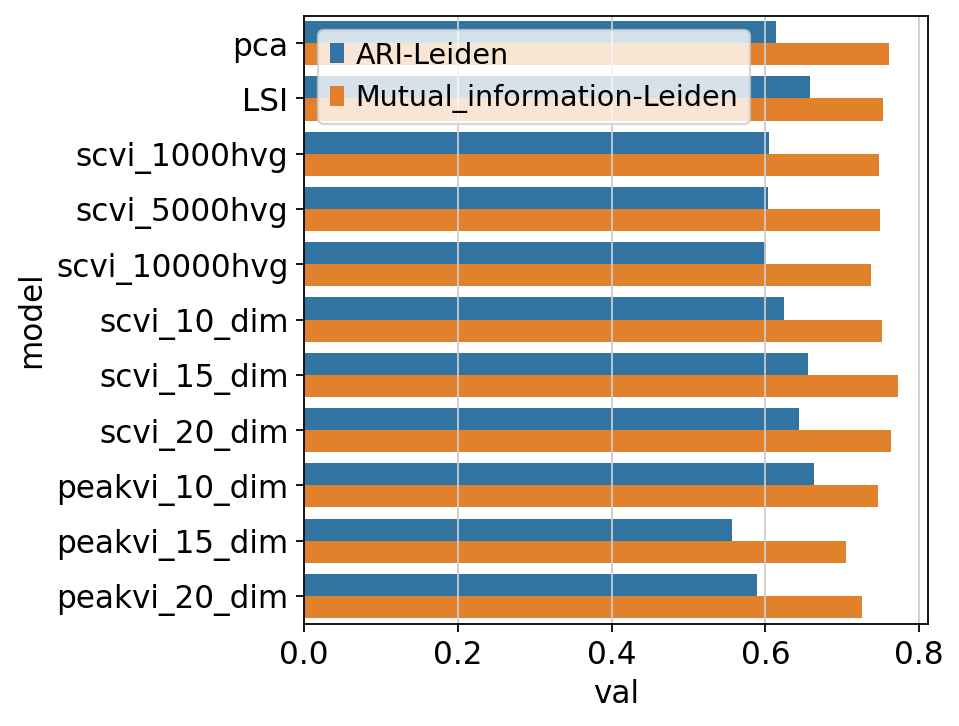

In [71]:
sns.barplot(y="model", x="val", hue="metric", data=df)
plt.legend(loc="upper left")
plt.savefig("figures/comapring_embeddings.pdf")

# PeakVI - perturbation

In [ ]:
# make sure that the file paths and the number of hvg are in the same orientation!
p = "anndata_object_dims"
adata = scvi.data.read_h5ad(dir_data + p)

for n in  [10, 15, 20]:
    # use scVI latent space for UMAP generation
    sc.pp.neighbors(adata, use_rep=f"X_scVI_{n}")
    sc.tl.umap(adata, min_dist=0.3)
    
    # leiden clustering
    sc.tl.leiden(adata, key_added=f"scVI_clusters", resolution=0.6)

    
    # kmeans clustering
    #emb = adata.obsm["X_scVI"]
    #kmeans = KMeans(n_clusters=37,
     #               init="random",
      #              n_init=200,
       #             random_state=0).fit(emb)
    #adata.obs["kmeans"] = kmeans.labels_.astype(str)
    
    sc.pl.umap(adata, color=["scVI_clusters",  "celltype.mapped"], title = [f"scVI_cluster - {n}_dim", "celltype"], palette = colPalette_celltypes, size = 15)

    metrics[f"scvi_{n}_dim"] =  (adjusted_rand_score(adata.obs["celltype.mapped"], adata.obs.scVI_clusters),#adjusted_rand_score(adata.obs.celltype, adata.obs.kmeans),
                   adjusted_mutual_info_score(adata.obs["celltype.mapped"], adata.obs.scVI_clusters))#, adjusted_mutual_info_score(adata.obs.celltype, adata.obs.kmeans))


# scATAC-seq

In [ ]:
paths = ["atac_gpu_trained_10_dim/", "atac_gpu_trained_15_dim/", "atac_gpu_trained_20_dim/"]

In [ ]:
for p in paths:
    adata = scvi.data.read_h5ad(p + "anndata_object_peakvi")
    model = scvi.model.PEAKVI.load(p, adata=adata, use_gpu=False)
    # use scVI latent space for UMAP generation
    sc.pp.neighbors(adata, use_rep="X_PeakVI")
    sc.tl.umap(adata, min_dist=0.3)
    
    # leiden clustering
    sc.tl.leiden(adata, key_added="peakVI_clusters", resolution=1.2)
    print(f"Using Leiden clustering we obtain: {len(adata.obs.peakVI_clusters.unique())} clusters")
    
    # kmeans clustering
    emb = adata.obsm["X_PeakVI"]
    kmeans = KMeans(n_clusters=37,
                    init="random",
                    n_init=200,
                    random_state=0).fit(emb)
    adata.obs["kmeans"] = kmeans.labels_.astype(str)
    
    # plot umaps
    sc.pl.umap(adata, color=["peakVI_clusters", "kmeans", "celltype.mapped_mnn"], title = [f"peakVI_clusters - {p}", "kmeans", "celltype"], palette = colPalette_celltypes, size = 15)

    #print(f"The adjusted Rand index when using kmeans clustering is: {adjusted_rand_score(adata.obs["celltype.mapped_mnn"], adata.obs.peakVI_clusters)}")
    metrics[p] =  (adjusted_rand_score(adata.obs["celltype.mapped_mnn"], adata.obs.peakVI_clusters),adjusted_rand_score(adata.obs["celltype.mapped_mnn"], adata.obs.kmeans),
                   adjusted_mutual_info_score(adata.obs["celltype.mapped_mnn"], adata.obs.peakVI_clusters), 
                   adjusted_mutual_info_score(adata.obs["celltype.mapped_mnn"], adata.obs.kmeans))


# multiVI

In [ ]:
paths = ["mvi_default/", "mvi_20_dim/", "mvi_10dim_no_modality/", "mvi_15_dim/", "mvi_15_dim_no_modality/", "mvi_10_dim/"]#, "mvi_10_dim/"]

In [ ]:
for p in paths:
    adata = scvi.data.read_h5ad(p + "anndata_object")
    model =  scvi.model.MULTIVI.load(p, adata=adata)
    # use scVI latent space for UMAP generation
    sc.pp.neighbors(adata, use_rep="X_multivi")
    sc.tl.umap(adata, min_dist=0.3)
    
    # leiden clustering
    sc.tl.leiden(adata, key_added="multiVI_clusters", resolution=1.2)
    print(f"Using Leiden clustering we obtain: {len(adata.obs.multiVI_clusters.unique())} clusters")
    
    # kmeans clustering
    emb = adata.obsm["X_multivi"]
    kmeans = KMeans(n_clusters=37,
                    init="random",
                    n_init=200,
                    random_state=0).fit(emb)
    adata.obs["kmeans"] = kmeans.labels_.astype(str)
    
    # plot umaps
    sc.pl.umap(adata, color=["multiVI_clusters", "kmeans", "celltype.mapped_mnn"], title = [f"multiVI_clusters - {p}", "kmeans", "celltype"], palette = colPalette_celltypes, size = 15)

    #print(f"The adjusted Rand index when using kmeans clustering is: {adjusted_rand_score(adata.obs["celltype.mapped_mnn"], adata.obs.peakVI_clusters)}")
    metrics[p] =  (adjusted_rand_score(adata.obs["celltype.mapped_mnn"], adata.obs.multiVI_clusters),adjusted_rand_score(adata.obs["celltype.mapped_mnn"], adata.obs.kmeans),
                   adjusted_mutual_info_score(adata.obs["celltype.mapped_mnn"], adata.obs.multiVI_clusters), 
                   adjusted_mutual_info_score(adata.obs["celltype.mapped_mnn"], adata.obs.kmeans))


In [ ]:
metrics

# Plotting Metrics

In [ ]:
df = pd.DataFrame.from_dict(metrics)

In [ ]:
df = df.rename(index={0:"ARI-Leiden", 1:"ARI-kmeans", 2:"Mutual_information-Leiden", 3:"Mutual_information-kmeans"})

In [ ]:
df["metric"] = df.index
df.index = [0,1,2,3]

In [ ]:
#df = df.rename(columns = {"gpu_trained_10_dim/":"model_rna_10dim", "gpu_trained_15_dim/":"model_rna_15dim", "gpu_trained_20_dim/":"model_rna_20dim", 
         #            "pca":"model_pca",
          #          "atac_gpu_trained_10_dim/":"model_atac_10dim", "atac_gpu_trained_15_dim/":"model_atac_15dim", "atac_gpu_trained_20_dim/":"model_atac_20dim"})

In [ ]:
#df.columns = 'model_atac_10dim', 'model_atac_15dim', 'model_atac_20dim', 'model_pca','model_rna_10dim', 'model_rna_15dim', 'model_rna_20dim', 'metric'

In [ ]:
df

In [ ]:
df = df.melt("metric", var_name = "model", value_name = "val")

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
sns.barplot(y="model", x="val", hue="metric", data=df)
plt.legend(loc="upper left")

### 10 dimensional embedding

#### Leiden Clustering

In [ ]:
# load anndata with latent space
adata = scvi.data.read_h5ad("gpu_trained_10_dim/anndata_object")

In [ ]:
model = scvi.model.SCVI.load("gpu_trained_10_dim/", adata=adata, use_gpu=False)

In [ ]:
# use scVI latent space for UMAP generation
sc.pp.neighbors(adata, use_rep="X_scVI")
sc.tl.umap(adata, min_dist=0.3)

In [ ]:
sc.tl.leiden(adata, key_added="scVI_clusters", resolution=1.2)

In [ ]:
print(f"Using Leiden clustering we obtain: {len(adata.obs.scVI_clusters.unique())} clusters")

In [ ]:
sc.set_figure_params(figsize=(8,8))
sc.pl.umap(adata, color="scVI_clusters", palette = colPalette_celltypes, size = 15)

In [ ]:
print(f"The adjusted Rand index when using Leiden clustering is: {adjusted_rand_score(adata.obs.celltype, adata.obs.scVI_clusters)}")


In [ ]:
metrics["rna_10_leiden"] =  adjusted_rand_score(adata.obs.celltype, adata.obs.scVI_clusters)

#### K-means clustering

In [ ]:
emb = adata.obsm["X_scVI"]
kmeans = KMeans(n_clusters=37,
                init="random",
                n_init=200,
                random_state=0).fit(emb)


In [ ]:
adata.obs["kmeans"] = kmeans.labels_.astype(str)

In [ ]:
print(f"The adjusted Rand index when using k-means clustering is: {adjusted_rand_score(adata.obs.celltype, adata.obs.kmeans)}")

In [ ]:
metrics["rna_10_kmeans"] = adjusted_rand_score(adata.obs.celltype, adata.obs.kmeans)

### 15 dimensional embedding

#### Leiden Clustering

In [ ]:
# load anndata with latent space
adata = scvi.data.read_h5ad("gpu_trained_15_dim/anndata_object")

In [ ]:
model = scvi.model.SCVI.load("gpu_trained_15_dim/", adata=adata, use_gpu=False)

In [ ]:
# use scVI latent space for UMAP generation
sc.pp.neighbors(adata, use_rep="X_scVI")
sc.tl.umap(adata, min_dist=0.3)

In [ ]:
sc.tl.leiden(adata, key_added="scVI_clusters", resolution=1.2)

In [ ]:
print(f"Using Leiden clustering we obtain: {len(adata.obs.scVI_clusters.unique())} clusters")

In [ ]:
sc.set_figure_params(figsize=(8,8))
sc.pl.umap(adata, color="scVI_clusters", palette = colPalette_celltypes, size = 15)

In [ ]:
print(f"The adjusted Rand index when using Leiden clustering is: {adjusted_rand_score(adata.obs.celltype, adata.obs.scVI_clusters)}")

In [ ]:
metrics["rna_15_kmeans"] = adjusted_rand_score(adata.obs.celltype, adata.obs.kmeans)

#### K-means clustering

In [ ]:
emb = adata.obsm["X_scVI"]
kmeans = KMeans(n_clusters=37,
                init="random",
                n_init=200,
                random_state=0).fit(emb)


In [ ]:
adata.obs["kmeans"] = kmeans.labels_.astype(str)

In [ ]:
print(f"The adjusted Rand index when using k-means clustering is: {adjusted_rand_score(adata.obs.celltype, adata.obs.kmeans)}")

In [ ]:
metrics["rna_15_kmeans"] = adjusted_rand_score(adata.obs.celltype, adata.obs.kmeans)

### 20 dimensional embedding

#### Leiden Clustering

In [ ]:
# load anndata with latent space
adata = scvi.data.read_h5ad("gpu_trained_20_dim/anndata_object")

In [ ]:
model = scvi.model.SCVI.load("gpu_trained_20_dim/", adata=adata, use_gpu=False)

In [ ]:
# use scVI latent space for UMAP generation
sc.pp.neighbors(adata, use_rep="X_scVI")
sc.tl.umap(adata, min_dist=0.3)

In [ ]:
sc.tl.leiden(adata, key_added="scVI_clusters", resolution=1.2)

In [ ]:
print(f"Using Leiden clustering we obtain: {len(adata.obs.scVI_clusters.unique())} clusters")

In [ ]:
sc.set_figure_params(figsize=(8,8))
sc.pl.umap(adata, color="scVI_clusters", palette = colPalette_celltypes, size = 15)

In [ ]:
print(f"The adjusted Rand index when using Leiden clustering is: {adjusted_rand_score(adata.obs.celltype, adata.obs.scVI_clusters)}")

In [ ]:
metrics["rna_20_kmeans"] = adjusted_rand_score(adata.obs.celltype, adata.obs.kmeans)

#### K-means clustering

In [ ]:
emb = adata.obsm["X_scVI"]
kmeans = KMeans(n_clusters=37,
                init="random",
                n_init=200,
                random_state=0).fit(emb)


In [ ]:
adata.obs["kmeans"] = kmeans.labels_.astype(str)

In [ ]:
print(f"The adjusted Rand index when using k-means clustering is: {adjusted_rand_score(adata.obs.celltype, adata.obs.kmeans)}")

In [ ]:
metrics["rna_20_kmeans"] = adjusted_rand_score(adata.obs.celltype, adata.obs.kmeans)

## scATAC-seq

### 10 dimensional embedding

#### Leiden Clustering

In [ ]:
# load anndata with latent space
adata = scvi.data.read_h5ad("atac_gpu_trained_10_dim/anndata_object_peakvi")

In [ ]:
pvi = scvi.model.PEAKVI.load("atac_gpu_trained_10_dim/", adata=adata, use_gpu=False)

In [ ]:
# use scVI latent space for UMAP generation
sc.pp.neighbors(adata, use_rep="X_PeakVI")
sc.tl.umap(adata, min_dist=0.3)

In [ ]:
sc.tl.leiden(adata, key_added="PeakVI_clusters", resolution=1.2)

In [ ]:
print(f"Using Leiden clustering we obtain: {len(adata.obs.PeakVI_clusters.unique())} clusters")

In [ ]:
sc.set_figure_params(figsize=(8,8))
sc.pl.umap(adata, color="PeakVI_clusters", palette = colPalette_celltypes, size = 15)

In [ ]:
print(f"The adjusted Rand index when using Leiden clustering is: {adjusted_rand_score(adata.obs["celltype.mapped_mnn"], adata.obs.PeakVI_clusters)}")

In [ ]:
metrics["atac_10_leiden"] = adjusted_rand_score(adata.obs["celltype.mapped_mnn"], adata.obs.PeakVI_clusters)

#### K-means clustering

In [ ]:
emb = adata.obsm["X_PeakVI"]
kmeans = KMeans(n_clusters=37,
                init="random",
                n_init=200,
                random_state=0).fit(emb)


In [ ]:
adata.obs["kmeans"] = kmeans.labels_.astype(str)

In [ ]:
print(f"The adjusted Rand index when using k-means clustering is: {adjusted_rand_score(adata.obs.celltype, adata.obs.kmeans)}")

In [ ]:
metrics["atac_10_kmeans"] = adjusted_rand_score(adata.obs.celltype, adata.obs.kmeans)

### 15 dimensional embedding

#### Leiden Clustering

In [ ]:
# load anndata with latent space
adata = scvi.data.read_h5ad("atac_gpu_trained_15_dim/anndata_object_peakvi")

In [ ]:
pvi = scvi.model.PEAKVI.load("atac_gpu_trained_15_dim/", adata=adata, use_gpu=False)

In [ ]:
# use scVI latent space for UMAP generation
sc.pp.neighbors(adata, use_rep="X_PeakVI")
sc.tl.umap(adata, min_dist=0.3)

In [ ]:
sc.tl.leiden(adata, key_added="PeakVI_clusters", resolution=1.2)

In [ ]:
print(f"Using Leiden clustering we obtain: {len(adata.obs.PeakVI_clusters.unique())} clusters")

In [ ]:
sc.set_figure_params(figsize=(8,8))
sc.pl.umap(adata, color="PeakVI_clusters", palette = colPalette_celltypes, size = 15)

In [ ]:
print(f"The adjusted Rand index when using Leiden clustering is: {adjusted_rand_score(adata.obs["celltype.mapped_mnn"], adata.obs.PeakVI_clusters)}")

In [ ]:
metrics["atac_15_leiden"] = adjusted_rand_score(adata.obs["celltype.mapped_mnn"], adata.obs.PeakVI_clusters)

#### K-means clustering

In [ ]:
emb = adata.obsm["X_PeakVI"]
kmeans = KMeans(n_clusters=37,
                init="random",
                n_init=200,
                random_state=0).fit(emb)


In [ ]:
adata.obs["kmeans"] = kmeans.labels_.astype(str)

In [ ]:
print(f"The adjusted Rand index when using k-means clustering is: {adjusted_rand_score(adata.obs.celltype, adata.obs.kmeans)}")

In [ ]:
metrics["atac_15_kmeans"] = adjusted_rand_score(adata.obs.celltype, adata.obs.kmeans)

### 20 dimensional embedding

#### Leiden Clustering

In [ ]:
# load anndata with latent space
adata = scvi.data.read_h5ad("atac_gpu_trained_20_dim/anndata_object_peakvi")

In [ ]:
pvi = scvi.model.PEAKVI.load("atac_gpu_trained_20_dim/", adata=adata, use_gpu=False)

In [ ]:
# use scVI latent space for UMAP generation
sc.pp.neighbors(adata, use_rep="X_PeakVI")
sc.tl.umap(adata, min_dist=0.3)

In [ ]:
sc.tl.leiden(adata, key_added="PeakVI_clusters", resolution=1.2)

In [ ]:
print(f"Using Leiden clustering we obtain: {len(adata.obs.PeakVI_clusters.unique())} clusters")

In [ ]:
sc.set_figure_params(figsize=(8,8))
sc.pl.umap(adata, color="PeakVI_clusters", palette = colPalette_celltypes, size = 15)

In [ ]:
print(f"The adjusted Rand index when using Leiden clustering is: {adjusted_rand_score(adata.obs["celltype.mapped_mnn"], adata.obs.PeakVI_clusters)}")

In [ ]:
metrics["atac_20_leiden"] = adjusted_rand_score(adata.obs["celltype.mapped_mnn"], adata.obs.PeakVI_clusters)

#### K-means clustering

In [ ]:
emb = adata.obsm["X_PeakVI"]
kmeans = KMeans(n_clusters=37,
                init="random",
                n_init=200,
                random_state=0).fit(emb)


In [ ]:
adata.obs["kmeans"] = kmeans.labels_.astype(str)

In [ ]:
print(f"The adjusted Rand index when using k-means clustering is: {adjusted_rand_score(adata.obs.celltype, adata.obs.kmeans)}")

In [ ]:
metrics["atac_20_kmeans"] = adjusted_rand_score(adata.obs.celltype, adata.obs.kmeans)